In [1]:
from google.colab import drive
import os, textwrap, pprint, sys
drive.mount('/content/drive')
DRIVE_DATA_ROOT = "/content/drive/MyDrive/Colab_Datasets/Junior_project"
print("\nChecking DRIVE_DATA_ROOT:", DRIVE_DATA_ROOT)
if not os.path.exists(DRIVE_DATA_ROOT):
    print("ERROR: Path does not exist. Please (a) upload the dataset to Drive and (b) set DRIVE_DATA_ROOT to the correct folder.")
    print("List your MyDrive root here to help find it:")
    print(sorted(os.listdir("/content/drive/MyDrive"))[:200])
    raise SystemExit("Please update DRIVE_DATA_ROOT and re-run this cell.")
entries = sorted(os.listdir(DRIVE_DATA_ROOT))
print("\nEntries in DRIVE_DATA_ROOT (first 200):")
pprint.pprint(entries[:200])
zips = [f for f in entries if f.lower().endswith(('.zip','.tar','.tar.gz','.7z'))]
if zips:
    print("\nFound archive(s) in folder:")
    for z in zips:
        p = os.path.join(DRIVE_DATA_ROOT, z)
        print(" -", z, "size:", os.path.getsize(p)//(1024*1024), "MB")
candidate = None
possible = ["RGB-T wildfire dataset", "RGB-T wildfire dataset/", "RGB-T wildfire dataset (1)", "RGB-T wildfire dataset (copy)"]
for name in entries:
    if name.lower().startswith("rgb") or "wild" in name.lower() or "rgb-t" in name.lower() or "rgbt" in name.lower():
        candidate = name
        break

if candidate:
    dataset_path = os.path.join(DRIVE_DATA_ROOT, candidate)
    if os.path.isdir(dataset_path):
        print(f"\nFound likely dataset folder: {candidate}\nListing top-level files/folders inside it:")
        pprint.pprint(sorted(os.listdir(dataset_path))[:200])
    else:
        print(f"\nFound likely dataset file: {candidate} (not a folder). If this is a zip, we will unzip in Step 2.")
else:
    print("\nNo obvious dataset folder found automatically. If you uploaded a zip file, note the filename from the list above and tell me.")



Mounted at /content/drive

Checking DRIVE_DATA_ROOT: /content/drive/MyDrive/Colab_Datasets/Junior_project

Entries in DRIVE_DATA_ROOT (first 200):
['RGB-T wildfire dataset', 'RGB-T wildfire dataset.zip']

Found archive(s) in folder:
 - RGB-T wildfire dataset.zip size: 778 MB

Found likely dataset folder: RGB-T wildfire dataset
Listing top-level files/folders inside it:
['RGB-T wildfire dataset']


In [2]:
from google.colab import drive
import zipfile, os, shutil
drive_root = "/content/drive/MyDrive"
zip_paths = []
for root, dirs, files in os.walk(drive_root):
    for f in files:
        if f.endswith(".zip"):
            zip_paths.append(os.path.join(root, f))

if not zip_paths:
    raise FileNotFoundError("No .zip files found anywhere in your Drive!")

print("Found ZIP files:")
for i, z in enumerate(zip_paths):
    print(f"[{i}] {z}")
zip_index = 0
zip_path = zip_paths[zip_index]
print(f"\n Using ZIP file: {zip_path}")
local_zip = "/content/RGB-T_wildfire_dataset.zip"
print("Copying to local storage...")
shutil.copy(zip_path, local_zip)
extract_path = "/content/RGB-T_wildfire_dataset"
os.makedirs(extract_path, exist_ok=True)

print("Unzipping locally...")
with zipfile.ZipFile(local_zip, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
print("Extraction complete!")
print("\nExtracted folder contents:")
print(os.listdir(extract_path)[:20])


Found ZIP files:
[0] /content/drive/MyDrive/Colab_Datasets/Junior_project/RGB-T wildfire dataset.zip
[1] /content/drive/MyDrive/datasets/RGB-T wildfire dataset.zip

 Using ZIP file: /content/drive/MyDrive/Colab_Datasets/Junior_project/RGB-T wildfire dataset.zip
Copying to local storage...
Unzipping locally...
Extraction complete!

Extracted folder contents:
['RGB-T wildfire dataset']


In [3]:
BASE = "/content/RGB-T_wildfire_dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")


In [4]:
!pip uninstall -y opencv-python-headless opencv-python albumentations ultralytics pycocotools shapely
!pip install -q ultralytics==8.0.149 pycocotools shapely tqdm matplotlib
!pip install -q albumentations==2.0.8 opencv-python-headless>=4.9.0.80
!pip install --upgrade pip
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121
!pip install tensorflow keras
!pip install opencv-python
!pip install scikit-image
!pip install imageio
!pip install pandas numpy h5py
!pip install matplotlib seaborn plotly
!pip install tqdm pillow albumentations
!pip install ultralytics


Found existing installation: opencv-python-headless 4.12.0.88
Uninstalling opencv-python-headless-4.12.0.88:
  Successfully uninstalled opencv-python-headless-4.12.0.88
Found existing installation: opencv-python 4.12.0.88
Uninstalling opencv-python-4.12.0.88:
  Successfully uninstalled opencv-python-4.12.0.88
Found existing installation: albumentations 2.0.8
Uninstalling albumentations-2.0.8:
  Successfully uninstalled albumentations-2.0.8
Found existing installation: pycocotools 2.0.10
Uninstalling pycocotools-2.0.10:
  Successfully uninstalled pycocotools-2.0.10
Found existing installation: shapely 2.1.2
Uninstalling shapely-2.1.2:
  Successfully uninstalled shapely-2.1.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 614.4/614.4 kB 27.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.1/397.1 kB 31.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 110.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 40.5 MB/s eta 0:00:0

In [5]:
ZIP_PATH="/content/drive/MyDrive/Colab_Datasets/Junior_project/RGB-T wildfire dataset.zip"
EXTRACT_PATH="/content/rgbt3m"
!mkdir -p $EXTRACT_PATH
!unzip -q "$ZIP_PATH" -d $EXTRACT_PATH
!echo "Top-level folders/files in extracted dataset:"
!ls -la $EXTRACT_PATH


Top-level folders/files in extracted dataset:
total 12
drwxr-xr-x 3 root root 4096 Dec  4 08:06  .
drwxr-xr-x 1 root root 4096 Dec  4 08:06  ..
drwxr-xr-x 5 root root 4096 Nov 27  2023 'RGB-T wildfire dataset'


In [6]:
import os

BASE = "/content/rgbt3m/RGB-T wildfire dataset"
folders = ["rgb", "nir", "mask"]

for f in folders:
    path = os.path.join(BASE, f)
    files = sorted([file for file in os.listdir(path) if not file.startswith('.')])
    print(f"{f} folder -> {len(files)} files, first 5 files: {files[:5]}")


rgb folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
nir folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
mask folder -> 1367 files, first 5 files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']


In [7]:
import cv2, numpy as np
BASE="/content/rgbt3m/RGB-T wildfire dataset"
rgb_dir = os.path.join(BASE,"rgb")
nir_dir = os.path.join(BASE,"nir")
mask_dir = os.path.join(BASE,"mask")

def safe_list(d):
    return sorted([f for f in os.listdir(d) if not f.startswith('.')]) if os.path.exists(d) else []
rgb = safe_list(rgb_dir)
nir = safe_list(nir_dir)
masks = safe_list(mask_dir)
print("Counts -> rgb:", len(rgb), "nir:", len(nir), "mask:", len(masks))
print("First 5 rgb files:", rgb[:5])
print("First 5 mask files:", masks[:5])
if masks:
    sample = os.path.join(mask_dir, masks[0])
    m = cv2.imread(sample, cv2.IMREAD_UNCHANGED)
    print("Sample mask file:", masks[0], "shape:", None if m is None else m.shape, "unique values:", None if m is None else np.unique(m))
else:
    print("No mask files found. Check BASE path.")


Counts -> rgb: 1367 nir: 1367 mask: 1367
First 5 rgb files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
First 5 mask files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png']
Sample mask file: 100A_gt.png shape: (512, 640) unique values: [  0 255]


In [8]:
from tqdm import tqdm
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
rgb_dir = os.path.join(BASE, "rgb")
nir_dir = os.path.join(BASE, "nir")
mask_dir = os.path.join(BASE, "mask")
all_files = sorted(os.listdir(rgb_dir))
print(f"Found {len(all_files)} samples")
rgb_images, nir_images, mask_images = [], [], []
for f in tqdm(all_files, desc="Loading all samples"):
    rgb_path = os.path.join(rgb_dir, f)
    nir_path = os.path.join(nir_dir, f)
    mask_path = os.path.join(mask_dir, f)
    rgb = cv2.imread(rgb_path)
    if rgb is None:
        print(f"Skipping missing RGB file: {f}")
        continue
    rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)

    nir = cv2.imread(nir_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if nir is None or mask is None:
        print(f" Skipping incomplete sample: {f}")
        continue

    rgb_images.append(rgb)
    nir_images.append(nir)
    mask_images.append(mask)

print("\n All images loaded successfully!")
print(f"Total valid samples: {len(rgb_images)}")
unique_sizes = set([img.shape for img in rgb_images])
print(f"Unique RGB image sizes: {unique_sizes}")
print(f"NIR example shape: {nir_images[0].shape}")
print(f"Mask example shape: {mask_images[0].shape}")
print(f"Example mask unique values: {np.unique(mask_images[0])}")


Found 1367 samples


Loading all samples: 100%|██████████| 1367/1367 [00:19<00:00, 70.94it/s]


 All images loaded successfully!
Total valid samples: 1367
Unique RGB image sizes: {(420, 420, 3), (512, 640, 3)}
NIR example shape: (512, 640)
Mask example shape: (512, 640)
Example mask unique values: [  0 255]


In [9]:
import albumentations as A
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")
IMG_SIZE = (512, 640)
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.4),
    A.GaussianBlur(blur_limit=(3,7), p=0.3),
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])

val_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])
class RGBTWildfireDataset(Dataset):
    def __init__(self, rgb_dir, nir_dir, mask_dir, filenames=None, transform=None):
        self.rgb_dir = rgb_dir
        self.nir_dir = nir_dir
        self.mask_dir = mask_dir
        self.filenames = sorted(filenames) if filenames else sorted(os.listdir(rgb_dir))
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        filename = self.filenames[idx]
        rgb = cv2.imread(os.path.join(self.rgb_dir, filename))
        rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
        nir = cv2.imread(os.path.join(self.nir_dir, filename), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(self.mask_dir, filename), cv2.IMREAD_GRAYSCALE)
        mask = (mask > 127).astype(np.float32)
        nir = np.expand_dims(nir, axis=-1)
        img_4ch = np.concatenate([rgb, nir], axis=-1)
        if self.transform:
            rgb_part = img_4ch[..., :3]
            augmented = self.transform(image=rgb_part, mask=mask)
            rgb_aug = augmented['image']
            mask = augmented['mask']
            nir_part = cv2.resize(nir, (rgb_aug.shape[1], rgb_aug.shape[0]), interpolation=cv2.INTER_LINEAR)
            nir_part = np.expand_dims(nir_part, axis=-1)
            img_4ch = np.concatenate([rgb_aug, nir_part], axis=-1)
        img_4ch = torch.from_numpy(img_4ch.transpose(2,0,1)).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img_4ch, mask
all_filenames = sorted(os.listdir(RGB_DIR))
train_files, val_files = train_test_split(all_filenames, test_size=0.2, random_state=42)


train_dataset = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=val_files, transform=val_transform)


train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=4, shuffle=False, num_workers=0)


images, masks = next(iter(train_loader))
print(f"Batch images shape: {images.shape}  # Expect [B,4,H,W]")
print(f"Batch masks shape: {masks.shape}    # Expect [B,1,H,W]")
print(f"Mask unique values in batch: {torch.unique(masks)}")


Batch images shape: torch.Size([4, 4, 512, 640])  # Expect [B,4,H,W]
Batch masks shape: torch.Size([4, 1, 512, 640])    # Expect [B,1,H,W]
Mask unique values in batch: tensor([0., 1.])


In [10]:
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")

all_files = sorted(os.listdir(RGB_DIR))
sample_files = all_files[:]
print("Selected files:", sample_files)


Selected files: ['100A_gt.png', '100E_gt.png', '100F_gt.png', '100_gt.png', '101A_gt.png', '101E_gt.png', '101F_gt.png', '101_gt.png', '102A_gt.png', '102E_gt.png', '102F_gt.png', '102_gt.png', '103A_gt.png', '103E_gt.png', '103F_gt.png', '103_gt.png', '104A_gt.png', '104E_gt.png', '104F_gt.png', '104_gt.png', '105A_gt.png', '105E_gt.png', '105F_gt.png', '105_gt.png', '106A_gt.png', '106E_gt.png', '106F_gt.png', '106_gt.png', '107A_gt.png', '107E_gt.png', '107F_gt.png', '107_gt.png', '108A_gt.png', '108E_gt.png', '108F_gt.png', '108_gt.png', '109A_gt.png', '109E_gt.png', '109F_gt.png', '109_gt.png', '10A_gt.png', '10C_gt.png', '10D_gt.png', '10E_gt.png', '10F_gt.png', '10_gt.png', '110A_gt.png', '110E_gt.png', '110F_gt.png', '110_gt.png', '111A_gt.png', '111E_gt.png', '111F_gt.png', '111_gt.png', '112A_gt.png', '112E_gt.png', '112F_gt.png', '112_gt.png', '113A_gt.png', '113E_gt.png', '113F_gt.png', '113_gt.png', '114A_gt.png', '114E_gt.png', '114F_gt.png', '114_gt.png', '115A_gt.png', 

In [11]:
from sklearn.model_selection import train_test_split

BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
MASK_DIR = os.path.join(BASE, "mask")

all_files = sorted(os.listdir(RGB_DIR))
print(f"Total RGB images: {len(all_files)}")
labels = []
for f in tqdm(all_files, desc="Analyzing masks for stratified split"):
    mask_path = os.path.join(MASK_DIR, f)
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask is None:
        print(f"Missing mask for {f}")
        continue
    has_fire = (mask > 127).any()
    labels.append(int(has_fire))

labels = np.array(labels)
print(f" Fire images: {np.sum(labels)} |  Non-fire images: {len(labels) - np.sum(labels)}")
train_files, val_files = train_test_split(
    all_files,
    test_size=0.2,
    random_state=42,
    stratify=labels
)

print(f"Train size: {len(train_files)}, Val size: {len(val_files)}")


Total RGB images: 1367


Analyzing masks for stratified split: 100%|██████████| 1367/1367 [00:01<00:00, 1274.38it/s]

 Fire images: 1298 |  Non-fire images: 69
Train size: 1093, Val size: 274


In [12]:
train_dataset = RGBTWildfireDataset(RGB_DIR, os.path.join(BASE, "nir"), MASK_DIR,
                                    filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, os.path.join(BASE, "nir"), MASK_DIR,
                                    filenames=val_files, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4, pin_memory=True)
val_loader   = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)




In [13]:
images, masks = next(iter(train_loader))
print(f"Batch images shape: {images.shape}  # Expect [B,4,H,W]")
print(f"Batch masks shape: {masks.shape}    # Expect [B,1,H,W]")
print(f"Mask unique values in batch: {torch.unique(masks)}")


Batch images shape: torch.Size([8, 4, 512, 640])  # Expect [B,4,H,W]
Batch masks shape: torch.Size([8, 1, 512, 640])    # Expect [B,1,H,W]
Mask unique values in batch: tensor([0., 1.])


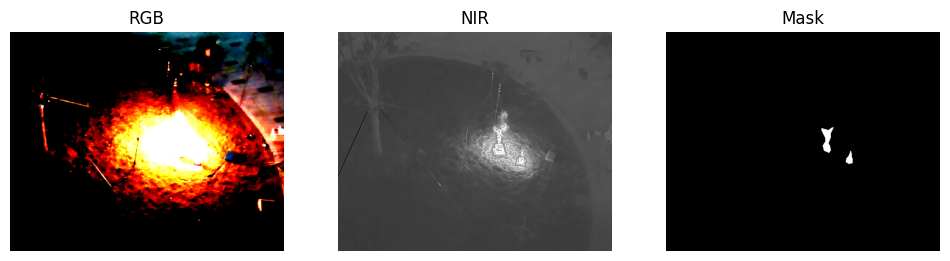

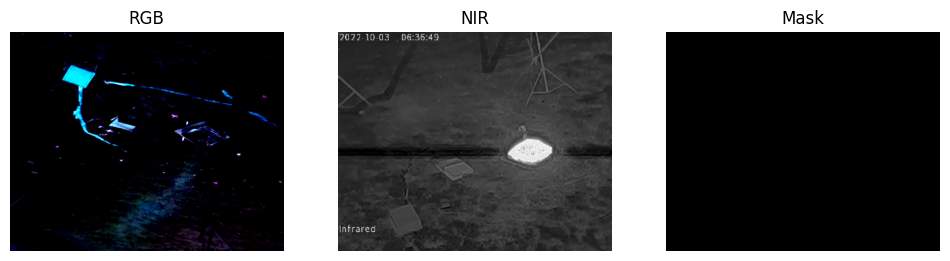

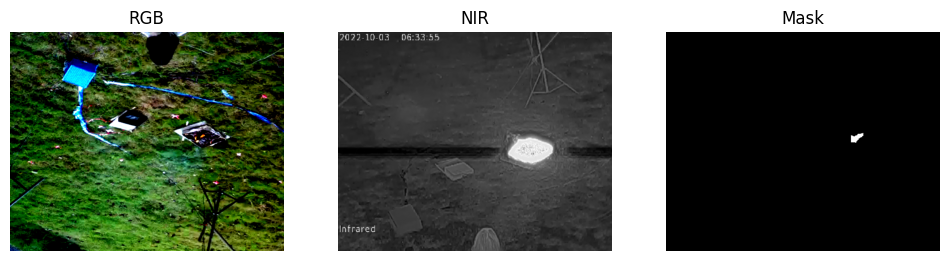

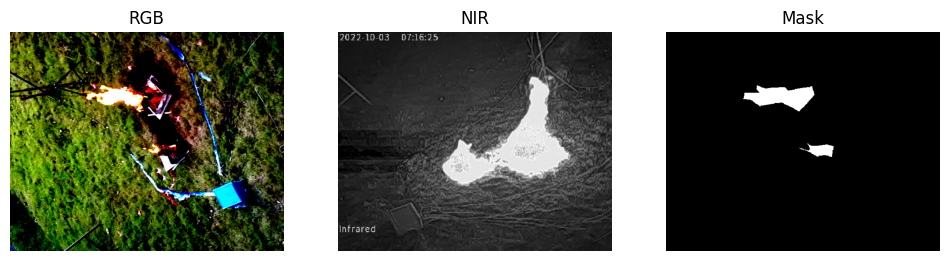

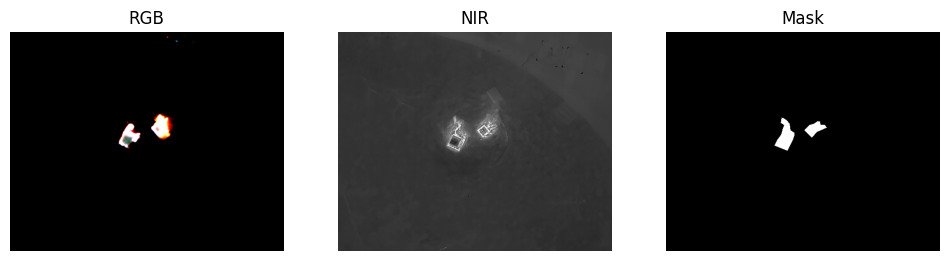

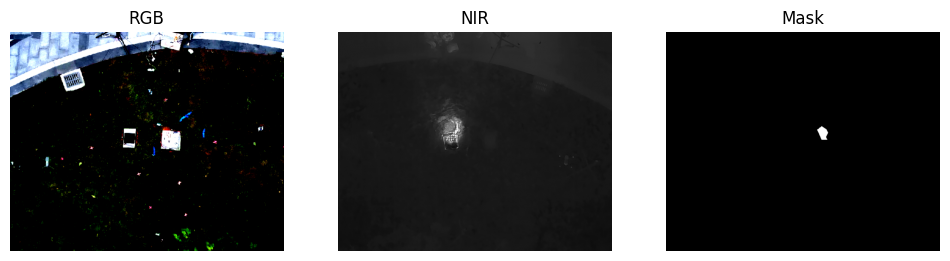

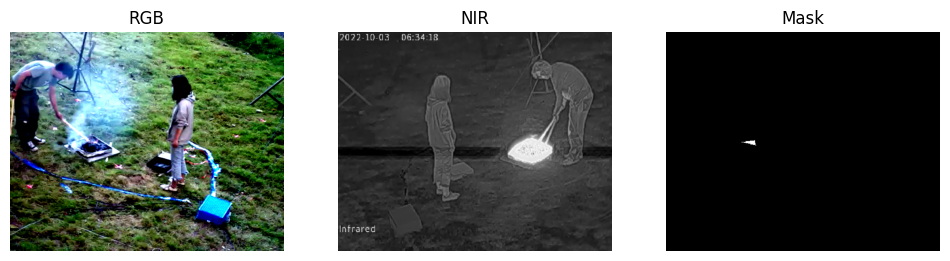

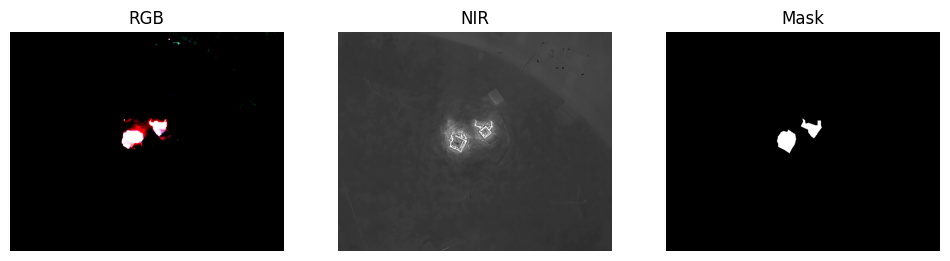

In [14]:
import matplotlib.pyplot as plt

for i in range(len(images)):
    plt.figure(figsize=(12,4))
    plt.subplot(1,3,1); plt.imshow(images[i][:3].permute(1,2,0)); plt.title("RGB"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(images[i][3].cpu(), cmap='gray'); plt.title("NIR"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(masks[i][0].cpu(), cmap='gray'); plt.title("Mask"); plt.axis('off')
    plt.show()


In [15]:
BASE = "/content/rgbt3m/RGB-T wildfire dataset"
RGB_DIR = os.path.join(BASE, "rgb")
NIR_DIR = os.path.join(BASE, "nir")
MASK_DIR = os.path.join(BASE, "mask")
IMG_SIZE = (512,640)
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"


In [16]:
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.3),
    A.RandomRotate90(p=0.5),
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=0.4),
    A.GaussianBlur(blur_limit=(3,7), p=0.3),
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])

val_transform = A.Compose([
    A.Resize(height=IMG_SIZE[0], width=IMG_SIZE[1]),
    A.Normalize(mean=(0.485,0.456,0.406,0.5), std=(0.229,0.224,0.225,0.25))
])


In [17]:
class RGBTWildfireDataset(Dataset):
    def __init__(self, rgb_dir, nir_dir, mask_dir, filenames, transform=None):
        self.rgb_dir = rgb_dir
        self.nir_dir = nir_dir
        self.mask_dir = mask_dir
        self.filenames = filenames
        self.transform = transform

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        rgb = cv2.imread(os.path.join(self.rgb_dir, fname))
        rgb = cv2.cvtColor(rgb, cv2.COLOR_BGR2RGB)
        nir = cv2.imread(os.path.join(self.nir_dir, fname), cv2.IMREAD_GRAYSCALE)
        mask = cv2.imread(os.path.join(self.mask_dir, fname), cv2.IMREAD_GRAYSCALE)
        mask = (mask > 127).astype(np.float32)
        nir = np.expand_dims(nir, -1)
        img_4ch = np.concatenate([rgb, nir], axis=-1)

        if self.transform:
            rgb_part = img_4ch[..., :3]
            aug = self.transform(image=rgb_part, mask=mask)
            rgb_aug = aug['image']
            mask = aug['mask']
            nir_part = cv2.resize(nir, (rgb_aug.shape[1], rgb_aug.shape[0]), interpolation=cv2.INTER_LINEAR)
            nir_part = np.expand_dims(nir_part, -1)
            img_4ch = np.concatenate([rgb_aug, nir_part], axis=-1)

        img_4ch = torch.from_numpy(img_4ch.transpose(2,0,1)).float()
        mask = torch.from_numpy(mask).unsqueeze(0).float()
        return img_4ch, mask


In [18]:
all_files = sorted(os.listdir(RGB_DIR))
print(f"Found {len(all_files)} total samples")

train_files, temp_files = train_test_split(all_files, test_size=0.2, random_state=42)
val_files, test_files = train_test_split(temp_files, test_size=0.5, random_state=42)

print(f"Train: {len(train_files)} | Val: {len(val_files)} | Test: {len(test_files)}")

train_dataset = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=train_files, transform=train_transform)
val_dataset   = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=val_files, transform=val_transform)
test_dataset  = RGBTWildfireDataset(RGB_DIR, NIR_DIR, MASK_DIR, filenames=test_files, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_dataset, batch_size=2, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_dataset, batch_size=2, shuffle=False, num_workers=0)

images, masks = next(iter(train_loader))
print(f" Batch images shape: {images.shape}")
print(f" Batch masks shape: {masks.shape}")
print(f"Mask unique values: {torch.unique(masks)}")


Found 1367 total samples
Train: 1093 | Val: 137 | Test: 137
 Batch images shape: torch.Size([4, 4, 512, 640])
 Batch masks shape: torch.Size([4, 1, 512, 640])
Mask unique values: tensor([0., 1.])


In [19]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.backends.cudnn.benchmark = True

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2):
        super().__init__()
        self.alpha, self.gamma = alpha, gamma
        self.bce = nn.BCEWithLogitsLoss(reduction='none')
    def forward(self, pred, target):
        bce = self.bce(pred, target)
        pt = torch.exp(-bce)
        return (self.alpha * (1 - pt) ** self.gamma * bce).mean()

class DiceLoss(nn.Module):
    def __init__(self, smooth=1):
        super().__init__()
        self.smooth = smooth
    def forward(self, pred, target):
        pred = torch.sigmoid(pred)
        inter = (pred * target).sum()
        return 1 - (2 * inter + self.smooth) / (pred.sum() + target.sum() + self.smooth)

class ComboLoss(nn.Module):
    def __init__(self):
        super().__init__()
        self.focal = FocalLoss()
        self.dice = DiceLoss()
    def forward(self, pred, target):
        return 0.5 * self.focal(pred, target) + 0.5 * self.dice(pred, target)

criterion = ComboLoss()

class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.ReLU(inplace=True)
        )
    def forward(self, x):
        return self.conv(x)

class AttentionBlock(nn.Module):
    def __init__(self, g_ch, x_ch, int_ch):
        super().__init__()
        self.Wg = nn.Sequential(nn.Conv2d(g_ch, int_ch, 1), nn.BatchNorm2d(int_ch))
        self.Wx = nn.Sequential(nn.Conv2d(x_ch, int_ch, 1), nn.BatchNorm2d(int_ch))
        self.psi = nn.Sequential(nn.Conv2d(int_ch, 1, 1), nn.Sigmoid())
    def forward(self, g, x):
        g1 = self.Wg(g)
        x1 = self.Wx(x)
        psi = self.psi(torch.relu(g1 + x1))
        return x * psi

class AttentionUNet(nn.Module):
    def __init__(self, in_ch=4, out_ch=1):
        super().__init__()
        self.down1 = DoubleConv(in_ch, 64)
        self.down2 = DoubleConv(64, 128)
        self.down3 = DoubleConv(128, 256)
        self.down4 = DoubleConv(256, 512)
        self.pool = nn.MaxPool2d(2)
        self.up = nn.Upsample(scale_factor=2, mode="bilinear", align_corners=True)
        self.att3 = AttentionBlock(512, 256, 128)
        self.att2 = AttentionBlock(256, 128, 64)
        self.att1 = AttentionBlock(128, 64, 32)
        self.up3 = DoubleConv(512 + 256, 256)
        self.up2 = DoubleConv(256 + 128, 128)
        self.up1 = DoubleConv(128 + 64, 64)
        self.out = nn.Conv2d(64, out_ch, 1)
    def forward(self, x):
        x1 = self.down1(x)
        x2 = self.down2(self.pool(x1))
        x3 = self.down3(self.pool(x2))
        x4 = self.down4(self.pool(x3))
        u3 = self.up(x4)
        a3 = self.att3(u3, x3)
        u3 = self.up3(torch.cat([a3, u3], dim=1))
        u2 = self.up(u3)
        a2 = self.att2(u2, x2)
        u2 = self.up2(torch.cat([a2, u2], dim=1))
        u1 = self.up(u2)
        a1 = self.att1(u1, x1)
        u1 = self.up1(torch.cat([a1, u1], dim=1))
        return self.out(u1)

model = AttentionUNet().to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=5e-4)

def sigmoid_bin(x):
    return (torch.sigmoid(x) > 0.5).float()

def dice_metric(p, t):
    p = sigmoid_bin(p)
    return (2 * (p * t).sum() + 1e-6) / (p.sum() + t.sum() + 1e-6)

def iou_metric(p, t):
    p = sigmoid_bin(p)
    inter = (p * t).sum()
    union = p.sum() + t.sum() - inter
    return (inter + 1e-6) / (union + 1e-6)

def compute_sklearn_metrics(p, t):
    p, t = p.flatten(), t.flatten()
    if p.sum() == 0 and t.sum() == 0:
        return 1, 1, 1, 1, 1
    return (
        accuracy_score(t, p),
        precision_score(t, p, zero_division=0),
        recall_score(t, p, zero_division=0),
        f1_score(t, p, zero_division=0),
        jaccard_score(t, p, zero_division=0)
    )

num_epochs, patience = 100, 15
best_dice, no_improve = 0, 0

for epoch in range(num_epochs):
    model.train()
    train_loss = 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        preds = model(imgs)
        loss = criterion(preds, masks)
        loss.backward()
        optimizer.step()
        train_loss += loss.item() * imgs.size(0)
    train_loss /= len(train_loader.dataset)

    model.eval()
    val_loss, dices = 0, []
    accs, precs, recs, f1s, ious = [], [], [], [], []
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            preds = model(imgs)
            val_loss += criterion(preds, masks).item()
            bin_preds = sigmoid_bin(preds).cpu().numpy().astype(np.uint8)
            bin_masks = masks.cpu().numpy().astype(np.uint8)
            acc, prec, rec, f1, iou = compute_sklearn_metrics(bin_preds, bin_masks)
            accs.append(acc); precs.append(prec); recs.append(rec)
            f1s.append(f1); ious.append(iou)
            dices.append(dice_metric(preds, masks).item())

    val_loss /= len(val_loader)
    val_dice = np.mean(dices)

    print("="*55)
    print(f" Epoch {epoch+1}/{num_epochs}")
    print("-"*55)
    print(f" Train Loss     : {train_loss:.4f}")
    print(f" Val Loss       : {val_loss:.4f}")
    print(f" Dice Score     : {val_dice:.4f}")
    print(f" IoU            : {np.mean(ious):.4f}")
    print(f" Accuracy       : {np.mean(accs):.4f}")
    print(f" Precision      : {np.mean(precs):.4f}")
    print(f" Recall         : {np.mean(recs):.4f}")
    print(f" F1-score       : {np.mean(f1s):.4f}")
    print("="*55)

    if val_dice > best_dice:
        best_dice, no_improve = val_dice, 0
        torch.save(model.state_dict(), "best_attention_unet.pth")
        print(" Best model saved")
    else:
        no_improve += 1
        if no_improve >= patience:
            print(" Early stopping")
            break

print("Finished. Best Dice:", best_dice)


 Epoch 1/100
-------------------------------------------------------
 Train Loss     : 0.3644
 Val Loss       : 0.5293
 Dice Score     : 0.0000
 IoU            : 0.0000
 Accuracy       : 0.9900
 Precision      : 0.0000
 Recall         : 0.0000
 F1-score       : 0.0000
 Best model saved
 Epoch 2/100
-------------------------------------------------------
 Train Loss     : 0.3176
 Val Loss       : 0.2783
 Dice Score     : 0.4656
 IoU            : 0.3254
 Accuracy       : 0.9887
 Precision      : 0.4774
 Recall         : 0.6535
 F1-score       : 0.4656
 Best model saved
 Epoch 3/100
-------------------------------------------------------
 Train Loss     : 0.3122
 Val Loss       : 0.3501
 Dice Score     : 0.3514
 IoU            : 0.2278
 Accuracy       : 0.9709
 Precision      : 0.2393
 Recall         : 0.8878
 F1-score       : 0.3514
 Epoch 4/100
-------------------------------------------------------
 Train Loss     : 0.3220
 Val Loss       : 0.2577
 Dice Score     : 0.4969
 IoU         

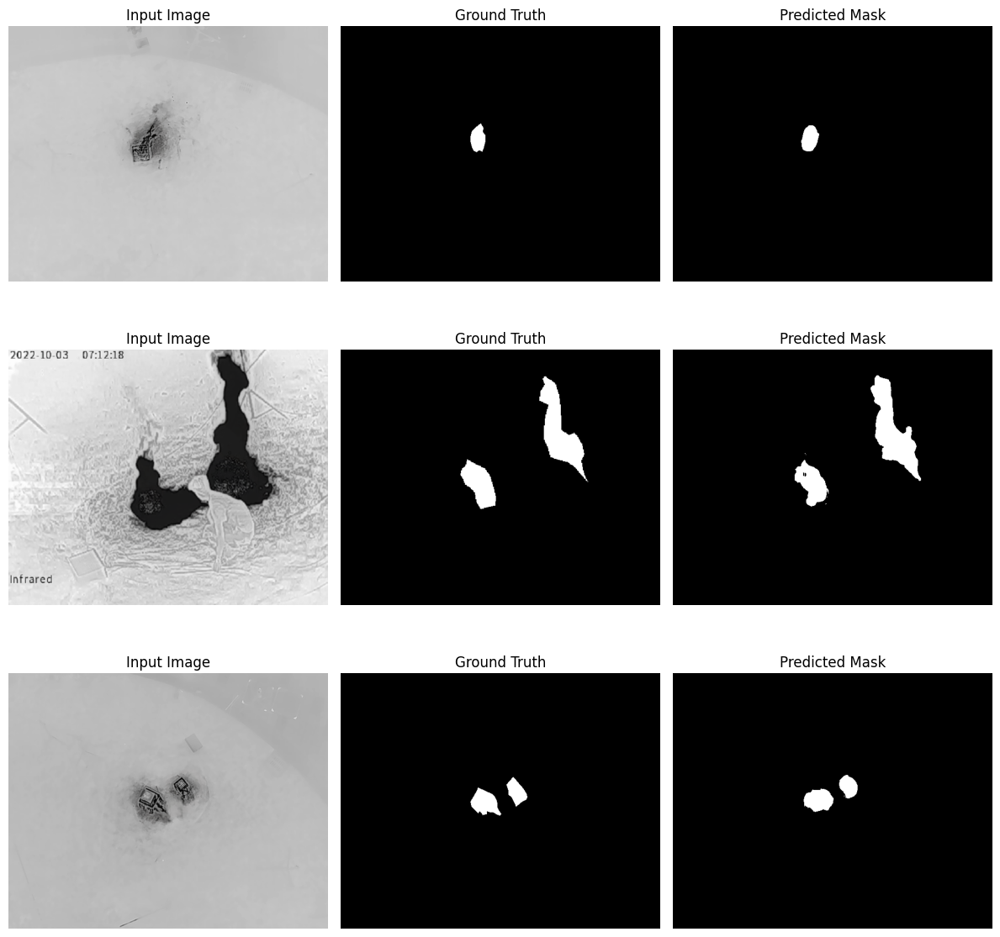

In [21]:
model.load_state_dict(torch.load("best_attention_unet.pth", map_location=DEVICE))
model.eval()

def visualize_predictions(model, dataloader, num_samples=3):
    model.eval()
    images_shown = 0

    plt.figure(figsize=(12, num_samples * 4))

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            outputs = model(imgs)
            preds = torch.sigmoid(outputs)
            preds = (preds > 0.5).float()

            for i in range(imgs.size(0)):
                if images_shown >= num_samples:
                    break

                img = imgs[i].cpu().numpy().transpose(1, 2, 0)
                mask = masks[i].cpu().squeeze().numpy()
                pred = preds[i].cpu().squeeze().numpy()

                img = (img - img.min()) / (img.max() - img.min() + 1e-6)

                plt.subplot(num_samples, 3, images_shown * 3 + 1)
                plt.imshow(img)
                plt.title("Input Image")
                plt.axis("off")

                plt.subplot(num_samples, 3, images_shown * 3 + 2)
                plt.imshow(mask, cmap="gray")
                plt.title("Ground Truth")
                plt.axis("off")

                plt.subplot(num_samples, 3, images_shown * 3 + 3)
                plt.imshow(pred, cmap="gray")
                plt.title("Predicted Mask")
                plt.axis("off")

                images_shown += 1

            if images_shown >= num_samples:
                break

    plt.tight_layout()
    plt.show()

visualize_predictions(model, val_loader, num_samples=3)


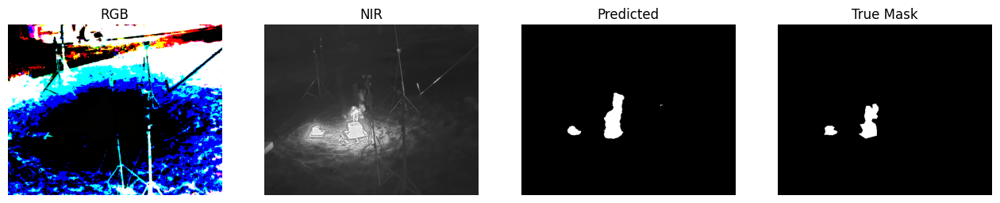

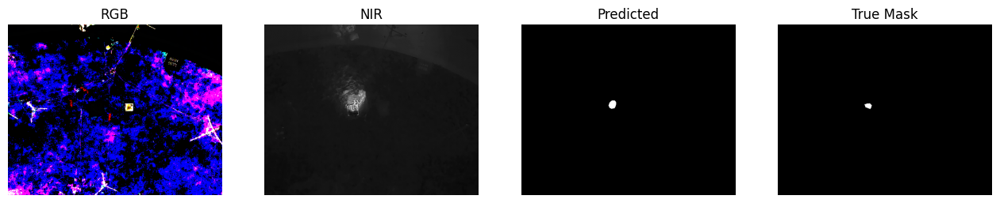

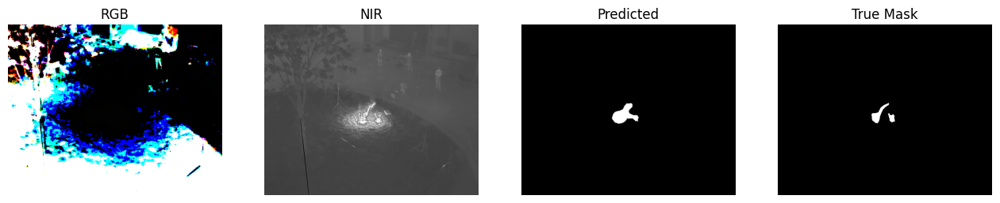

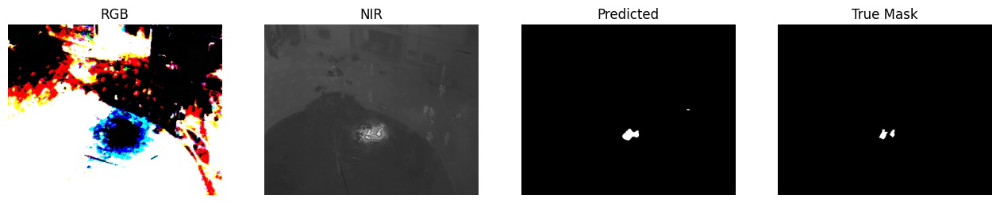

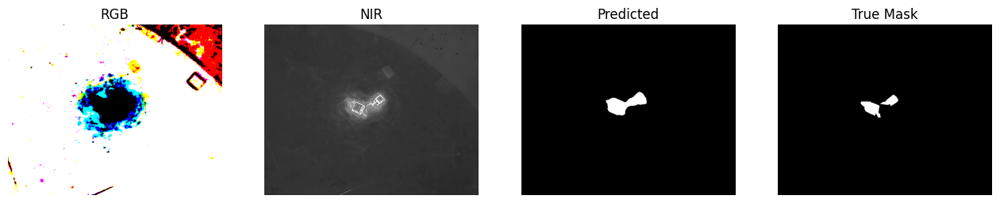

...

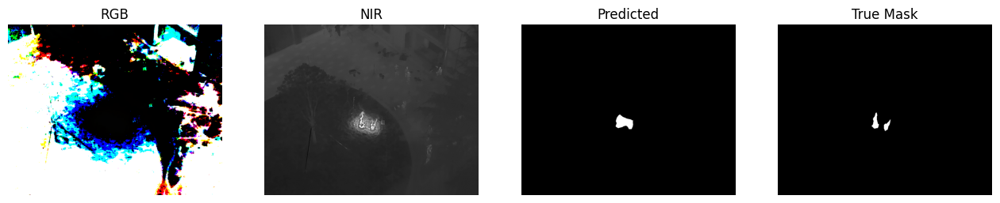

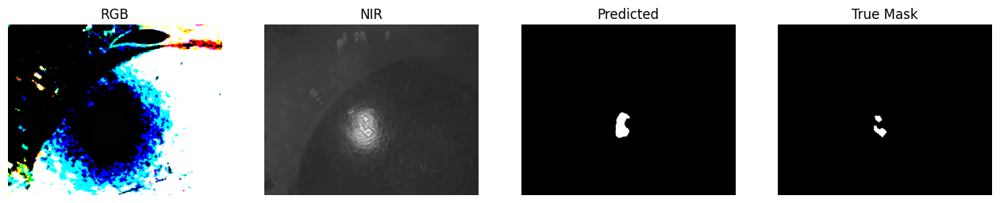

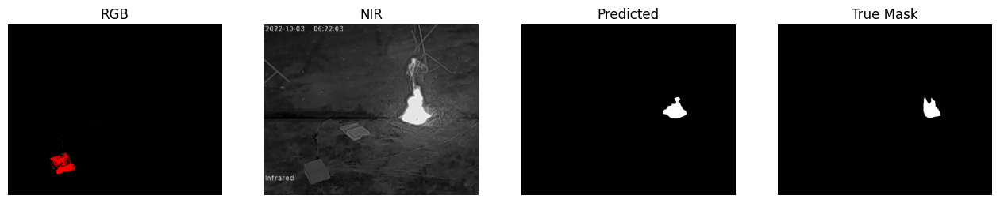

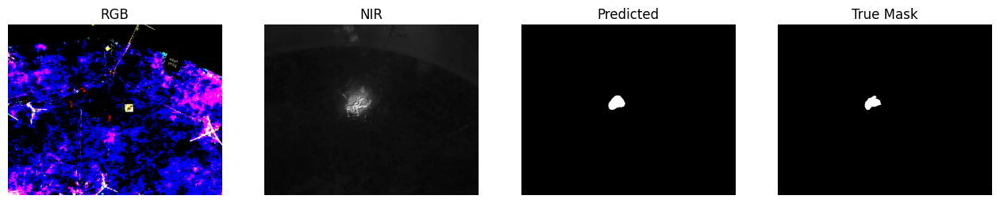

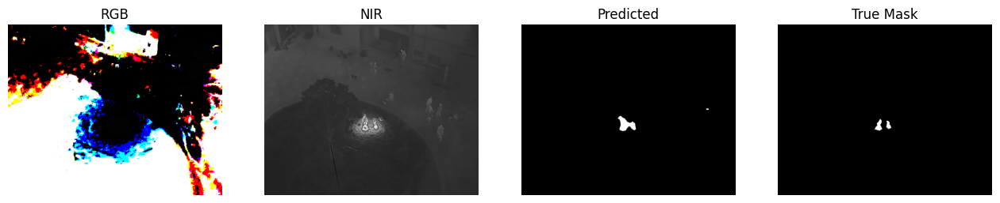

Accuracy: 0.9957
Precision: 0.6912
Recall:    0.8557
F1 Score:  0.7647
Dice:      0.7647

Confusion Matrix:
[[44381538   141228]
 [   53299   316095]]


In [22]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

all_preds = []
all_targets = []

model.eval()
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)
        preds = (torch.sigmoid(outputs) > 0.5).float()

        all_preds.extend(preds.cpu().numpy().reshape(-1))
        all_targets.extend(masks.cpu().numpy().reshape(-1))

        img = imgs[0].cpu().numpy().transpose(1,2,0)
        rgb, nir = img[...,:3].astype(np.uint8), img[...,3]
        mask_pred = preds[0,0].cpu().numpy()
        mask_true = masks[0,0].cpu().numpy()

        plt.figure(figsize=(16,4))
        plt.subplot(1,4,1); plt.imshow(rgb); plt.title("RGB"); plt.axis('off')
        plt.subplot(1,4,2); plt.imshow(nir, cmap='gray'); plt.title("NIR"); plt.axis('off')
        plt.subplot(1,4,3); plt.imshow(mask_pred, cmap='gray'); plt.title("Predicted"); plt.axis('off')
        plt.subplot(1,4,4); plt.imshow(mask_true, cmap='gray'); plt.title("True Mask"); plt.axis('off')
        plt.show()

all_preds = np.array(all_preds)
all_targets = np.array(all_targets)

acc = accuracy_score(all_targets, all_preds)
pre = precision_score(all_targets, all_preds)
rec = recall_score(all_targets, all_preds)
f1 = f1_score(all_targets, all_preds)
dice_score = (2 * (all_preds * all_targets).sum()) / (all_preds.sum() + all_targets.sum() + 1e-8)
cm = confusion_matrix(all_targets, all_preds)

print(f"Accuracy: {acc:.4f}")
print(f"Precision: {pre:.4f}")
print(f"Recall:    {rec:.4f}")
print(f"F1 Score:  {f1:.4f}")
print(f"Dice:      {dice_score:.4f}")
print("\nConfusion Matrix:")
print(cm)


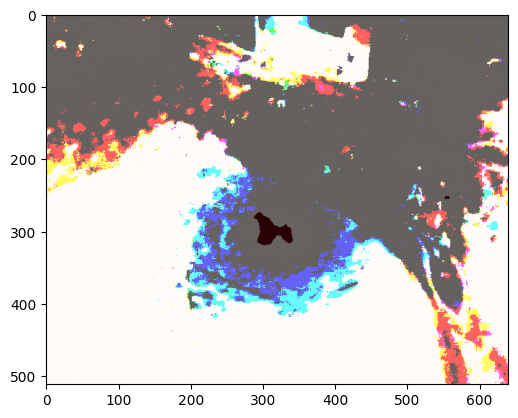

In [31]:
plt.imshow(rgb)
plt.imshow(mask_pred, alpha=0.4, cmap='Reds')
plt.show()


In [32]:
torch.save(model.state_dict(), "rgbt_attention_unet.pth")


Confusion Matrix:
 [[44381538   141228]
 [   53299   316095]]


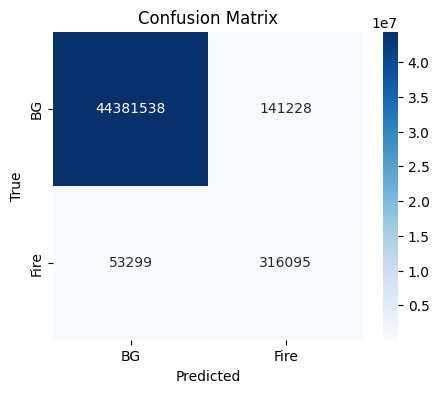

In [33]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = torch.sigmoid(model(imgs))
        preds = (outputs > 0.5).int()

        all_preds.append(preds.cpu().numpy().reshape(-1))
        all_labels.append(masks.cpu().numpy().reshape(-1))

all_preds = np.concatenate(all_preds)
all_labels = np.concatenate(all_labels)

cm = confusion_matrix(all_labels, all_preds)
print("Confusion Matrix:\n", cm)
plt.figure(figsize=(5,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['BG','Fire'], yticklabels=['BG','Fire'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


In [34]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, jaccard_score

accuracy  = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds)
recall    = recall_score(all_labels, all_preds)
f1        = f1_score(all_labels, all_preds)
iou       = jaccard_score(all_labels, all_preds)

print(f"Accuracy : {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall   : {recall:.4f}")
print(f"F1-score : {f1:.4f}")
print(f"IoU      : {iou:.4f}")


Accuracy : 0.9957
Precision: 0.6912
Recall   : 0.8557
F1-score : 0.7647
IoU      : 0.6190


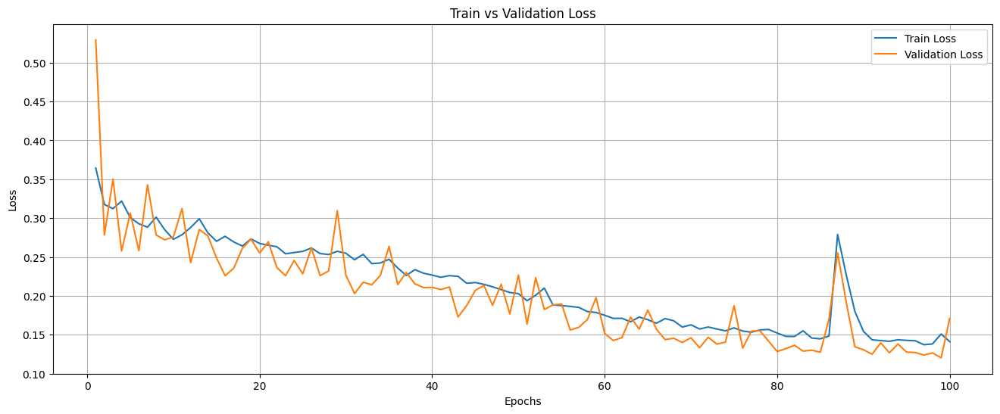

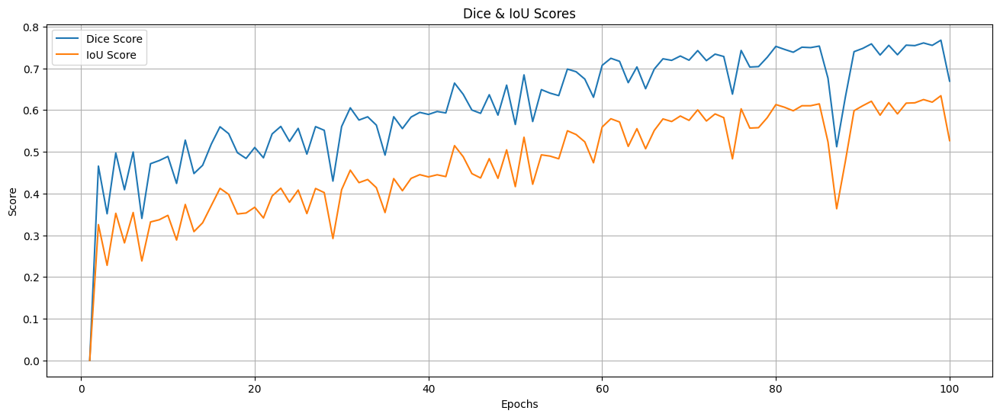

In [36]:
import numpy as np
import matplotlib.pyplot as plt

# ====== Your data from the logs ======
train_losses = [
    0.3644,0.3176,0.3122,0.3220,0.3007,0.2927,0.2883,0.3013,0.2850,0.2727,
    0.2786,0.2879,0.2991,0.2810,0.2702,0.2766,0.2693,0.2641,0.2732,0.2674,
    0.2651,0.2632,0.2541,0.2557,0.2572,0.2616,0.2544,0.2532,0.2573,0.2548,
    0.2464,0.2534,0.2414,0.2423,0.2470,0.2359,0.2262,0.2337,0.2291,0.2267,
    0.2239,0.2260,0.2251,0.2162,0.2171,0.2148,0.2116,0.2080,0.2043,0.2028,
    0.1937,0.2008,0.2100,0.1883,0.1875,0.1864,0.1851,0.1798,0.1786,0.1750,
    0.1710,0.1711,0.1666,0.1727,0.1693,0.1647,0.1707,0.1679,0.1598,0.1627,
    0.1573,0.1599,0.1573,0.1550,0.1588,0.1547,0.1532,0.1561,0.1568,0.1521,
    0.1479,0.1477,0.1550,0.1457,0.1447,0.1483,0.2790,0.2269,0.1800,0.1543,
    0.1434,0.1424,0.1415,0.1435,0.1427,0.1422,0.1371,0.1381,0.1509,0.1411
]

val_losses = [
    0.5293,0.2783,0.3501,0.2577,0.3065,0.2580,0.3429,0.2783,0.2720,0.2759,
    0.3122,0.2427,0.2853,0.2771,0.2487,0.2259,0.2356,0.2612,0.2729,0.2551,
    0.2696,0.2363,0.2259,0.2455,0.2283,0.2619,0.2260,0.2320,0.3096,0.2267,
    0.2029,0.2175,0.2142,0.2264,0.2637,0.2146,0.2300,0.2154,0.2106,0.2109,
    0.2081,0.2114,0.1728,0.1875,0.2071,0.2133,0.1878,0.2150,0.1766,0.2268,
    0.1636,0.2235,0.1824,0.1883,0.1895,0.1560,0.1595,0.1695,0.1978,0.1516,
    0.1425,0.1462,0.1726,0.1573,0.1816,0.1571,0.1437,0.1454,0.1400,0.1460,
    0.1332,0.1467,0.1379,0.1405,0.1874,0.1327,0.1546,0.1550,0.1417,0.1283,
    0.1321,0.1364,0.1289,0.1300,0.1275,0.1701,0.2554,0.1917,0.1345,0.1306,
    0.1248,0.1395,0.1268,0.1380,0.1276,0.1271,0.1238,0.1266,0.1203,0.1709
]

dice_scores = [
    0.0,0.4656,0.3514,0.4969,0.4090,0.4995,0.3403,0.4714,0.4789,0.4888,
    0.4241,0.5279,0.4478,0.4676,0.5185,0.5599,0.5433,0.4978,0.4840,0.5103,
    0.4855,0.5427,0.5608,0.5248,0.5561,0.4943,0.5603,0.5514,0.4297,0.5604,
    0.6053,0.5760,0.5838,0.5639,0.4920,0.5840,0.5555,0.5832,0.5944,0.5895,
    0.5965,0.5931,0.6646,0.6377,0.6000,0.5921,0.6367,0.5878,0.6597,0.5654,
    0.6843,0.5724,0.6489,0.6405,0.6346,0.6982,0.6918,0.6742,0.6306,0.7071,
    0.7240,0.7168,0.6656,0.7033,0.6511,0.6983,0.7228,0.7191,0.7295,0.7194,
    0.7425,0.7184,0.7340,0.7283,0.6381,0.7428,0.7030,0.7041,0.7263,0.7526,
    0.7453,0.7385,0.7506,0.7496,0.7533,0.6763,0.5121,0.6310,0.7399,0.7477,
    0.7586,0.7319,0.7551,0.7325,0.7555,0.7544,0.7608,0.7550,0.7674,0.6693
]

# You can add more metrics similarly: IoU, Accuracy, Precision, Recall, F1-score
# For example:
iou_scores = [0,0.3254,0.2278,0.3525,0.2816,0.3544,0.2382,0.3318,0.3370,0.3476,
              0.2884,0.3737,0.3086,0.3298,0.3712,0.4123,0.3977,0.3509,0.3532,0.3670,
              0.3413,0.3940,0.4127,0.3790,0.4082,0.3518,0.4120,0.4021,0.2920,0.4090,
              0.4559,0.4260,0.4335,0.4139,0.3543,0.4357,0.4066,0.4362,0.4451,0.4398,
              0.4448,0.4405,0.5147,0.4881,0.4476,0.4372,0.4835,0.4363,0.5046,0.4164,
              0.5348,0.4221,0.4926,0.4896,0.4832,0.5503,0.5413,0.5237,0.4736,0.5593,
              0.5791,0.5714,0.5128,0.5554,0.5072,0.5511,0.5787,0.5725,0.5857,0.5752,
              0.6004,0.5737,0.5907,0.5817,0.4830,0.6029,0.5567,0.5577,0.5816,0.6131,
              0.6066,0.5982,0.6103,0.6103,0.6148,0.5235,0.3635,0.4770,0.5984,0.6103,
              0.6211,0.5877,0.6177,0.5907,0.6165,0.6173,0.6251,0.6189,0.6343,0.5268]

epochs = np.arange(1, len(train_losses)+1)

# ====== Plotting ======
plt.figure(figsize=(16,6))
plt.plot(epochs, train_losses, label='Train Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(16,6))
plt.plot(epochs, dice_scores, label='Dice Score')
plt.plot(epochs, iou_scores, label='IoU Score')
plt.xlabel('Epochs')
plt.ylabel('Score')
plt.title('Dice & IoU Scores')
plt.legend()
plt.grid(True)
plt.show()


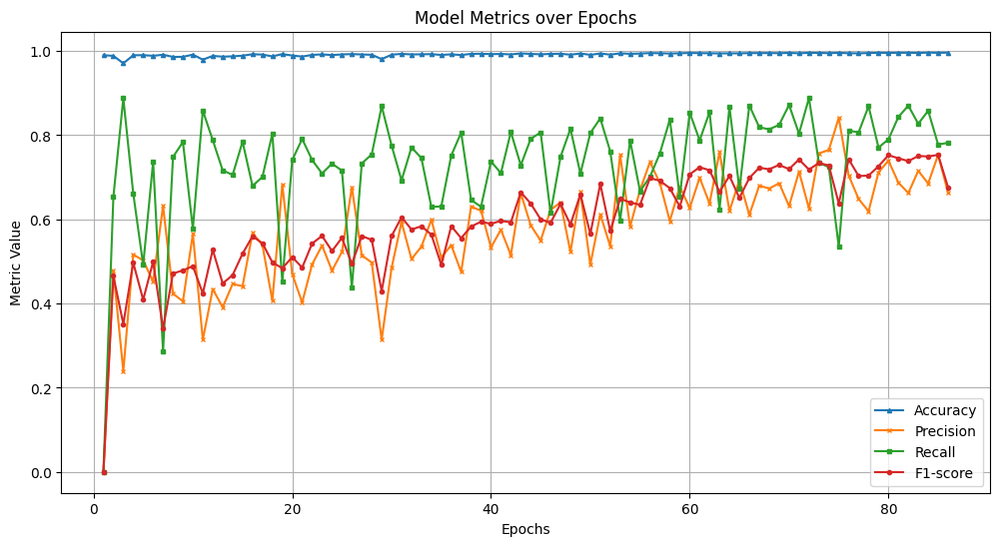

In [44]:
import matplotlib.pyplot as plt

# Example: your epoch numbers
epochs = list(range(1, 101))

# Your metrics (truncated to match the accuracy length, e.g., 89 values)
accuracy = [
    0.9900, 0.9887, 0.9709, 0.9900, 0.9903, 0.9887, 0.9913, 0.9861, 0.9863,
    0.9915, 0.9796, 0.9885, 0.9867, 0.9875, 0.9890, 0.9925, 0.9916, 0.9874,
    0.9928, 0.9894, 0.9869, 0.9909, 0.9921, 0.9905, 0.9920, 0.9928, 0.9919,
    0.9912, 0.9809, 0.9913, 0.9934, 0.9920, 0.9923, 0.9927, 0.9908, 0.9922,
    0.9906, 0.9933, 0.9936, 0.9927, 0.9931, 0.9920, 0.9944, 0.9933, 0.9922,
    0.9933, 0.9936, 0.9914, 0.9942, 0.9910, 0.9943, 0.9915, 0.9946, 0.9935,
    0.9941, 0.9952, 0.9949, 0.9941, 0.9948, 0.9955, 0.9951, 0.9948, 0.9944,
    0.9946, 0.9945, 0.9952, 0.9952, 0.9953, 0.9950, 0.9957, 0.9947, 0.9959,
    0.9956, 0.9951, 0.9958, 0.9949, 0.9946, 0.9954, 0.9959, 0.9957, 0.9959,
    0.9960, 0.9955, 0.9963, 0.9959, 0.9962
]

# Truncate epochs to match accuracy
epochs_short = epochs[:len(accuracy)]

# Your other metrics (F1, precision, recall) sliced to the same length
f1_score = [
    0.0000, 0.4656, 0.3514, 0.4969, 0.4090, 0.4995, 0.3403, 0.4714, 0.4789,
    0.4888, 0.4241, 0.5279, 0.4478, 0.4676, 0.5185, 0.5599, 0.5433, 0.4978,
    0.4840, 0.5103, 0.4855, 0.5427, 0.5608, 0.5248, 0.5561, 0.4943, 0.5603,
    0.5514, 0.4297, 0.5604, 0.6053, 0.5760, 0.5838, 0.5639, 0.4920, 0.5840,
    0.5555, 0.5832, 0.5944, 0.5895, 0.5965, 0.5931, 0.6646, 0.6377, 0.6000,
    0.5921, 0.6367, 0.5878, 0.6597, 0.5654, 0.6843, 0.5724, 0.6489, 0.6405,
    0.6346, 0.6982, 0.6918, 0.6742, 0.6306, 0.7071, 0.7240, 0.7168, 0.6656,
    0.7033, 0.6511, 0.6983, 0.7228, 0.7191, 0.7295, 0.7194, 0.7425, 0.7184,
    0.7340, 0.7283, 0.6381, 0.7428, 0.7030, 0.7041, 0.7263, 0.7526, 0.7453,
    0.7385, 0.7506, 0.7496, 0.7533, 0.6763, 0.5121, 0.6310, 0.7399, 0.7477
]

precision = [
    0.0000, 0.4774, 0.2393, 0.5164, 0.5025, 0.4521, 0.6325, 0.4237, 0.4052,
    0.5656, 0.3139, 0.4345, 0.3912, 0.4465, 0.4412, 0.5676, 0.5392, 0.4066,
    0.6830, 0.4699, 0.4025, 0.4931, 0.5379, 0.4783, 0.5226, 0.6764, 0.5146,
    0.4974, 0.3140, 0.4850, 0.5937, 0.5058, 0.5353, 0.5992, 0.5094, 0.5389,
    0.4750, 0.6305, 0.6205, 0.5333, 0.5755, 0.5152, 0.6623, 0.5861, 0.5495,
    0.6231, 0.6398, 0.5226, 0.6651, 0.4923, 0.6121, 0.5363, 0.7527, 0.5828,
    0.6694, 0.7363, 0.6862, 0.5959, 0.6781, 0.6271, 0.6990, 0.6380, 0.7598,
    0.6200, 0.6931, 0.6109, 0.6805, 0.6732, 0.6860, 0.6318, 0.7137, 0.6260,
    0.7569, 0.7649, 0.8415, 0.7043, 0.6484, 0.6193, 0.7118, 0.7396, 0.6875,
    0.6625, 0.7154, 0.6853, 0.7535, 0.6636, 0.4985, 0.6479, 0.6938, 0.7207
]

recall = [
    0.0000, 0.6535, 0.8878, 0.6616, 0.4916, 0.7368, 0.2866, 0.7483, 0.7840,
    0.5781, 0.8587, 0.7883, 0.7167, 0.7056, 0.7848, 0.6795, 0.7009, 0.8039,
    0.4513, 0.7411, 0.7912, 0.7411, 0.7092, 0.7324, 0.7160, 0.4386, 0.7329,
    0.7545, 0.8690, 0.7754, 0.6927, 0.7712, 0.7455, 0.6296, 0.6308, 0.7516,
    0.8063, 0.6461, 0.6301, 0.7378, 0.7099, 0.8077, 0.7287, 0.7916, 0.8065,
    0.6150, 0.7486, 0.8154, 0.7088, 0.8054, 0.8400, 0.7618, 0.5981, 0.7875,
    0.6670, 0.7011, 0.7572, 0.8371, 0.6550, 0.8536, 0.7878, 0.8552, 0.6236,
    0.8674, 0.6721, 0.8707, 0.8191, 0.8139, 0.8248, 0.8719, 0.8038, 0.8883,
    0.7344, 0.7243, 0.5355, 0.8109, 0.8069, 0.8689, 0.7708, 0.7901, 0.8434,
    0.8703, 0.8273, 0.8581, 0.7779, 0.7820, 0.6613, 0.6978, 0.8261, 0.8003
]

plt.figure(figsize=(12,6))
plt.plot(epochs_short, accuracy, label='Accuracy', marker='^', markersize=3)
plt.plot(epochs_short, precision[:len(accuracy)], label='Precision', marker='x', markersize=3)
plt.plot(epochs_short, recall[:len(accuracy)], label='Recall', marker='s', markersize=3)
plt.plot(epochs_short, f1_score[:len(accuracy)], label='F1-score', marker='o', markersize=3)

plt.xlabel("Epochs")
plt.ylabel("Metric Value")
plt.title("Model Metrics over Epochs")
plt.legend()
plt.grid(True)
plt.show()
